In [15]:
%matplotlib widget 
# Uncomment for interactive plots when running the notebook!

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from time import perf_counter

import import_ipynb

import PyPO
from PyPO.System import System
from PyPO.Enums import Projections, Objects, Units, Scales, FieldComponents, CurrentComponents

In [16]:
# This code allows us to display global variables within markdown output, by overriding the %%markdown magic
from IPython.display import Markdown
from IPython.core.magic import register_cell_magic

@register_cell_magic
def markdown(line, cell):
    return Markdown(cell.format(**globals()))

In [17]:
# Create the optical system
s = System()

2026-03-20 07:38:49 - WARNING - System override set to True. 


# Import SMA antenna parameters

We import the SMA antenna parameters from the `./design/sma_antenna_design.ipynb` notebook

In [18]:
# SMA antenna parameters

# Primary reflector
from design.sma_antenna_design import D_p, F_p, D_s, c_s, a_s, e_s, z_sh, f_s2, alpha

# Calculate distance from secondary edge plane to Cass focus
z_sef2 = (f_s2 + z_sh)

In [19]:
%%markdown 
## Imported Antenna parameters

| Parameter | Variable | Value | Unit |
| --- | --- | --: | --- |
| Primary Diameter | `D_p` | {D_p:.3f} | m |
| Primary Focal Length | `F_p` | {F_p:.3f} | m |
| Angle of edge ray | `alpha` | {alpha:.3f} | rad |
| Secondary Diameter | `D_s` | {D_s:.3f} | m | 
| Secondary Distance to Foci | `c_s` | {c_s:.6f} | m |
| Secondary Distance to Vertex | `a_s` | {a_s:.6f} | m |
| Secondary Eccentricity | `e_s` | {e_s:.6f} |   |
| Height of Secondary | `z_sh` | {z_sh:.6f} | m |
| Distance from Secondary to Focus | `z_sef2` | {z_sef2:.3f} | m |

## Imported Antenna parameters

| Parameter | Variable | Value | Unit |
| --- | --- | --: | --- |
| Primary Diameter | `D_p` | 6.000 | m |
| Primary Focal Length | `F_p` | 2.520 | m |
| Angle of edge ray | `alpha` | 1.074 | rad |
| Secondary Diameter | `D_s` | 0.350 | m | 
| Secondary Distance to Foci | `c_s` | 2.496463 | m |
| Secondary Distance to Vertex | `a_s` | 2.351026 | m |
| Secondary Eccentricity | `e_s` | 1.061861 |   |
| Height of Secondary | `z_sh` | 0.050521 | m |
| Distance from Secondary to Focus | `z_sef2` | 4.898 | m |


In [68]:
2*c_s

np.float64(4.992926666666662)

# Define a Gaussian feed

We initially define a Gaussian feed at the Cassegrain focus, with an -12 dB edge taper at the plane of the secondary edge, as a basic example of a Cassegrain antenna calculation

In [20]:
# Wavelength in millimeters
lam = 1.3*Units.MM
k = 2*np.pi/lam

# Gaussian feed parameters
edge_taper_db = -12.0 # Gaussian edge taper

# beam width at secondary
beamwidth_s = D_s*Units.M / 2 / ( 0.3393 * np.sqrt(-edge_taper_db))

# Calculate beam width at Cassegrain focus using Gaussian beam propagation
beamwidth_cass = beamwidth_s * np.sqrt((1 - np.sqrt(1 - (2*lam*(z_sef2*Units.M) / (np.pi*beamwidth_s**2))**2 ) )/2)
w_0 = beamwidth_cass

# Farfield divergence angle
theta_0 = np.rad2deg(lam / (np.pi*w_0))

# Directivity of feed
gain_feed = 8*np.pi**2*w_0**2/lam**2
gain_feed_db = 10*np.log10(gain_feed)

# Rayleigh range
rayleigh_range = np.pi*w_0**2 / lam
z_R = rayleigh_range

In [21]:
%%markdown

## Gaussian feed parameters

| Parameter | Variable | Value | Unit |
| --- | --- | --: | --- |
| Wavelength | `lam` | {lam:.3f} | mm |
| Beam waist | `w_0` | {w_0:.3f} | mm |
| Rayleigh range | `z_R` | {z_R:.3f} | mm |
| Farfield HWHM  | `theta_0` | {theta_0:.3f} | ° |
| Gain of feed  | `gain_feed` | {gain_feed_db:.3f} | dBi |


## Gaussian feed parameters

| Parameter | Variable | Value | Unit |
| --- | --- | --: | --- |
| Wavelength | `lam` | 1.300 | mm |
| Beam waist | `w_0` | 13.671 | mm |
| Rayleigh range | `z_R` | 451.630 | mm |
| Farfield HWHM  | `theta_0` | 1.734 | ° |
| Gain of feed  | `gain_feed` | 39.411 | dBi |


In [22]:
feed_plane_r = 2.5*w_0

## Calculate the required feed_plane size
z = 1.09*np.pi*2.5*feed_plane_r/lam*np.sin(np.atan(D_s*Units.MM/2 / (2*c_s*Units.MM))) + 10
print(z)

po1 = int(z/2.4)
po2 = int(z)

max_po1 = int(2*10*w_0/lam)
max_po2 = int(2*np.pi*2*feed_plane_r/lam)

print(f"Estimated Grid size : ({po1:d}, {po2:d})")
print(f"Maximum Grid size   : ({max_po1:d}, {max_po2:d})")

17.883467528695263
Estimated Grid size : (7, 17)
Maximum Grid size   : (210, 330)


In [23]:
# The feed plane defines the source fields - it needs sufficient size and resolution to
# contain the feed.
feed_plane = {
            "name"      : "feed_plane",
            "gmode"     : "uv",
            "lims_u"    : np.array([0, w_0*2.5])*Units.MM,
            "lims_v"    : np.array([0, 360]),
            "gridsize"  : np.array([max_po1, max_po2])
            }

s.addPlane(feed_plane)

2026-03-20 07:38:49 - INFO - Added plane feed_plane to system. 


In [24]:
# Create a Gaussian field in the feed plane

feed_dict = {                                                                                                                                                                     
            "name"    : "gaussian_feed",                                                                                                                                  
            "lam"     : lam,                                                                                                      
            "w0"      : w_0,                                                                                             
            "z"       : 0.0*Units.MM,
            "mode"    : "PEC"                                                                                                        
}

field_dict = {                                                                                                                                                                     
            "name"    : "gaussian_field",                                                                                                                                  
            "lam"     : lam,                                                                                                      
            "w0x"      : w_0,                                                                                             
            "w0y"      : w_0,                                                                                             
}

s.createGaussianBeam(feed_dict, "feed_plane")
s.createGaussian(field_dict, "feed_plane")

# Move the feed plane to the Cassegrain focus
s.translateGrids("feed_plane", np.array([0, 0, F_p - 2*c_s])*Units.M)

{'name': 'gaussian_feed', 'lam': 1.3, 'w0': np.float64(13.670612779669012), 'z': 0.0, 'mode': 2, 'n': 1.0, 'power': 12.566370614359172}
2026-03-20 07:38:49 - INFO - Translated element feed_plane by ('0.000e+00', '0.000e+00', '-2.473e+03') millimeters. 


In [25]:
feed_grid = s.generateGrids('feed_plane')

# Define the reflectors

In [26]:
## Calculate the required secondary grid size
z = 1.09*np.pi*D_s*Units.M/lam*np.sin(alpha) + 10
print(z)

po1 = int(z/2.4)
po2 = int(z)

max_po1 = int(D_s*Units.M/lam)
max_po2 = int(2*np.pi*D_s*Units.M/lam)

print(f"Estimated Grid size : ({po1:d}, {po2:d})")
print(f"Maximum Grid size   : ({max_po1:d}, {max_po2:d})")

820.408910848911
Estimated Grid size : (341, 820)
Maximum Grid size   : (269, 1691)


In [27]:
secondary = {
            "name"      : "secondary",
            "pmode"     : "focus",
            "gmode"     : "uv",
            "flip"      : True,
            "focus_1"   : np.array([0, 0, F_p])*Units.M,
            "focus_2"   : np.array([0, 0, F_p - 2*c_s])*Units.M,
            "ecc"       : e_s,
            "lims_u"    : np.array([0, D_s/2])*Units.M,
            "lims_v"    : np.array([0, 360]),
            "gridsize"  : np.array([720, 1200])
            }
s.addHyperbola(secondary)


2026-03-20 07:38:49 - INFO - Added hyperboloid secondary to system. 


In [28]:
sec_grid = s.generateGrids("secondary")

In [29]:
## Calculate the required primary grid size
z = 1.09*np.pi*D_p*Units.M/lam*np.sin(np.deg2rad(2)) + 10
print(z)

po1 = int(z/2.4)
po2 = int(z)

max_po1 = int(D_p*Units.M/lam)
max_po2 = int(2*np.pi*D_p*Units.M/lam)

print(f"Estimated Grid size : ({po1:d}, {po2:d})")
print(f"Maximum Grid size   : ({max_po1:d}, {max_po2:d})")

561.5735508098546
Estimated Grid size : (233, 561)
Maximum Grid size   : (4615, 28999)


In [30]:

primary = {
            "name"      : "primary",
            "pmode"     : "focus",
            "gmode"     : "uv",
            "vertex"    : np.zeros(3),
            "focus_1"   : np.array([0, 0, F_p])*Units.M,
            "lims_u"    : np.array([D_s/2, D_p/2])*Units.M,
            "lims_v"    : np.array([0, 360]),
            "gridsize"  : np.array([po1, 720])
            }

s.addParabola(primary)

2026-03-20 07:38:49 - INFO - Added paraboloid primary to system. 


In [31]:
pri_grid = s.generateGrids("primary")

# Define the output field planes

In [32]:
secondary_edge_plane = {
            "name"      : "sec_plane",
            "gmode"     : "uv",
            "lims_u"    : np.array([0, D_s/2])*Units.M,
            "lims_v"    : np.array([0, 359]),
            "gridsize"  : np.array([301, 360])
            }
s.addPlane(secondary_edge_plane)

s.translateGrids("sec_plane", np.array([0.0, 0.0, F_p - (c_s - a_s) + z_sh])*Units.M)

ff_size = 0.2*Units.DEG
ff_ngrid = 301

farfield_plane = {
            "name"      : "farfield_plane",
            "gmode"     : "AoE",
            "lims_Az"    : np.array([-1.0, 1.0])*ff_size,
            "lims_El"    : np.array([-1.0, 1.0])*ff_size,
            "gridsize"  : np.array([ff_ngrid, ff_ngrid])
            }
s.addPlane(farfield_plane)

2026-03-20 07:38:49 - INFO - Added plane sec_plane to system. 
2026-03-20 07:38:49 - INFO - Translated element sec_plane by ('0.000e+00', '0.000e+00', '2.425e+03') millimeters. 
2026-03-20 07:38:49 - INFO - Added plane farfield_plane to system. 


# Check the system

We plot the system to check that everything looks right

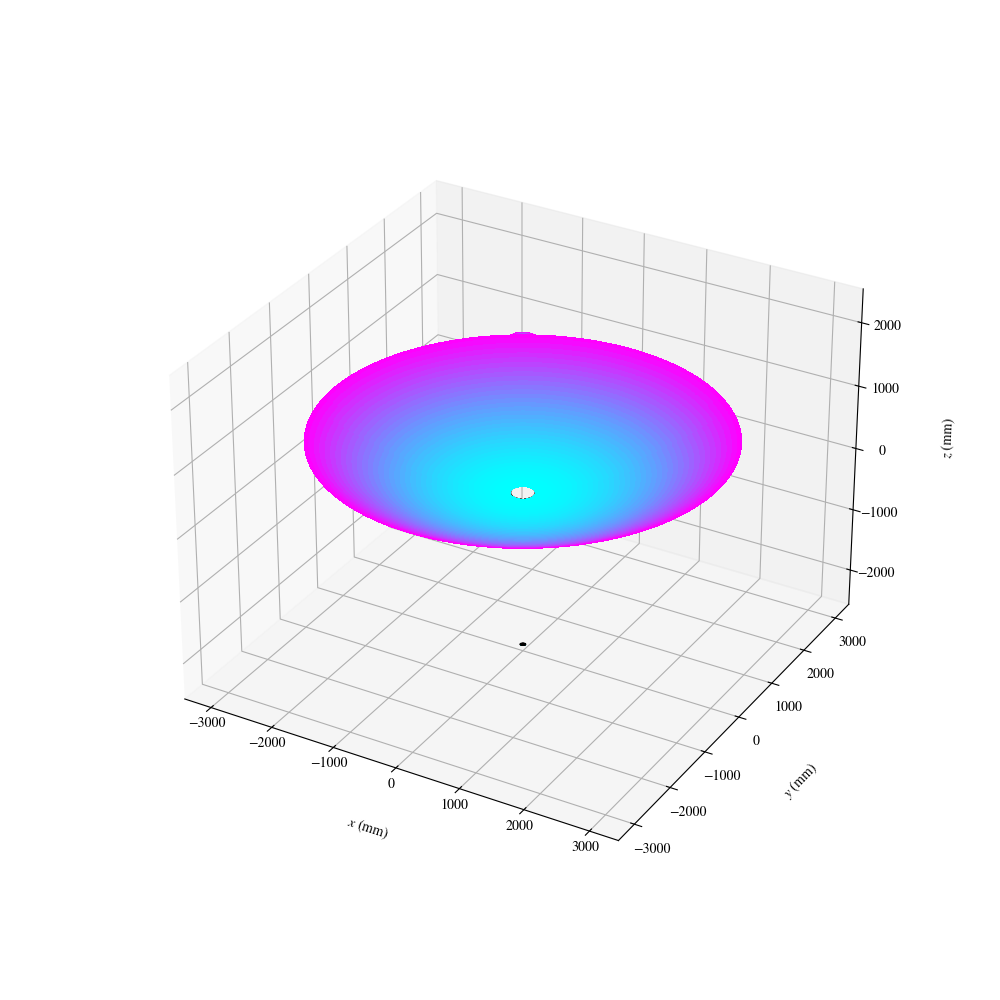

In [33]:
s.plotSystem(select=['primary', 'secondary', 'feed_plane'], norm=True)

# Check the convergence on the primary

We check that the secondary has enough points for the surface integrals used in calculating the currents on the primary to converge.

# Set up the Physical Optics Calculations

We now setup the physical optics calculations through the system.

The `method` can be either `CPU` or `GPU` to choose between the C and CUDA implementations. This change also affects the
the floating point precision used in the calculations.

The `mode` for intermediate surfaces can be either `JMEH` or `JM`. In the `JMEH`, both the E & H fields and the J & M 
currents are calculated and stored on each surface.  In the `JM` mode, only the currents are stored. Choosing the `JM` mode
is somewhat faster, and uses less RAM.

In [34]:
method = 'GPU'
if method == 'CPU':
    nThreads = 15
else:
    nThreads = 256
mode = 'JMEH'

epsilon = 1.0

In [35]:
# Physical optics calculation definition from feed to secondary
feed_to_sec_PO = {
        "t_name"    : "secondary",
        "s_current" : "gaussian_feed",
        "epsilon"   : epsilon,
        "mode"      : mode,
        "name_JM"   : "JM_sec",
        "name_EH"   : "EH_sec",
        "device"    : method,
        "nThreads"  : nThreads
        }

# Physical optics calculation definition from field to secondary
field_to_sec_PO = {
        "t_name"    : "secondary",
        "s_current" : "gaussian_field",
        "epsilon"   : epsilon,
        "mode"      : mode,
        "name_JM"   : "JM_sec2",
        "name_EH"   : "EH_sec2",
        "device"    : method,
        "nThreads"  : nThreads
        }

# Physical optics calculation definition from feed to secondary edge plane
feed_to_sec_plane_PO = {
        "t_name"    : "sec_plane",
        "s_current" : "gaussian_feed",
        "epsilon"   : epsilon,
        "mode"      : "EH",
        "name_EH"   : "EH_sec_plane",
        "device"    : method,
        "nThreads"  : nThreads
        }



In [36]:
# Define a second Gaussian beam on the secondary itself

sec_feed_dict = {                                                                                                                                                                     
            "name"    : "sec_feed",                                                                                                                                  
            "lam"     : lam,                                                                                                      
            "w0"      : w_0,                                                                                             
            "z"       : (2*c_s - F_p)*Units.M,
            "mode"    : "PEC"                                                                                                        
}

s.createGaussianBeam(sec_feed_dict, "secondary")

{'name': 'sec_feed', 'lam': 1.3, 'w0': np.float64(13.670612779669012), 'z': np.float64(2472.926666666662), 'mode': 2, 'n': 1.0, 'power': 12.566370614359172}


# Run the Physical Optics calculation on secondary

We run the full Physical Optics calculations, and collect some perfomance information on the way

In [37]:
start = perf_counter()
step_times = []

s.runPO(feed_to_sec_PO)
step_times.append(perf_counter() - start)


2026-03-20 07:38:54 - WORK - *** Starting PO propagation *** 
2026-03-20 07:38:54 - WORK - Propagating gaussian_feed on feed_plane to secondary, propagation mode: JMEH. 
2026-03-20 07:38:54 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-20 07:38:54 - WORK - ... Calculating ... 
2026-03-20 07:39:02 - WORK - *** Finished: 8.023 seconds *** 


In [38]:
start = perf_counter()
step_times = []

s.runPO(field_to_sec_PO)
step_times.append(perf_counter() - start)

2026-03-20 07:39:02 - WORK - *** Starting PO propagation *** 
2026-03-20 07:39:02 - WORK - Propagating gaussian_field on feed_plane to secondary, propagation mode: JMEH. 
2026-03-20 07:39:02 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-20 07:39:02 - WORK - ... Calculating ... 
2026-03-20 07:39:11 - WORK - *** Finished: 9.476 seconds *** 


## Fields at Secondary from sec_feed

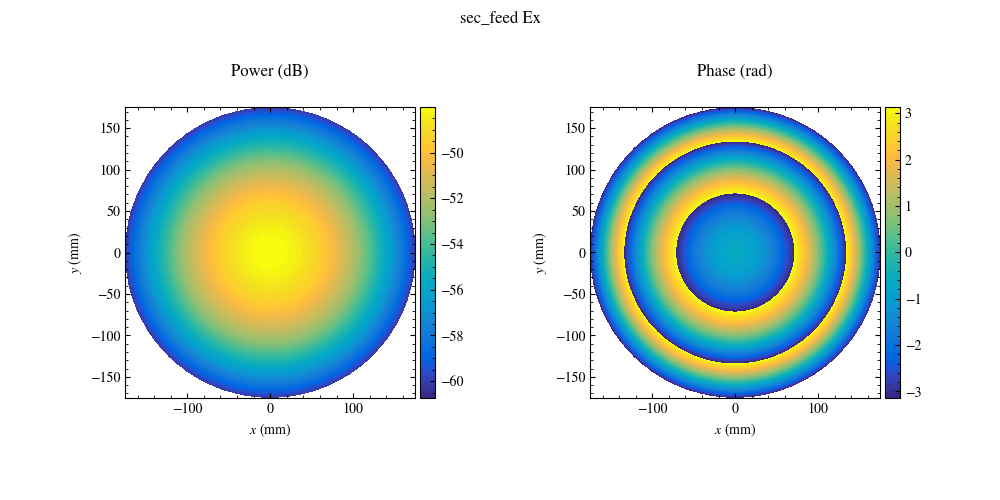

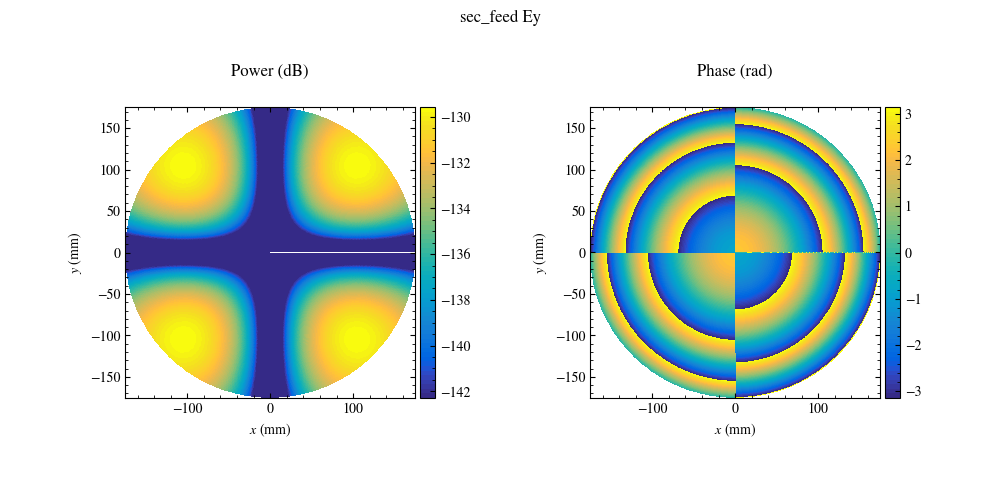

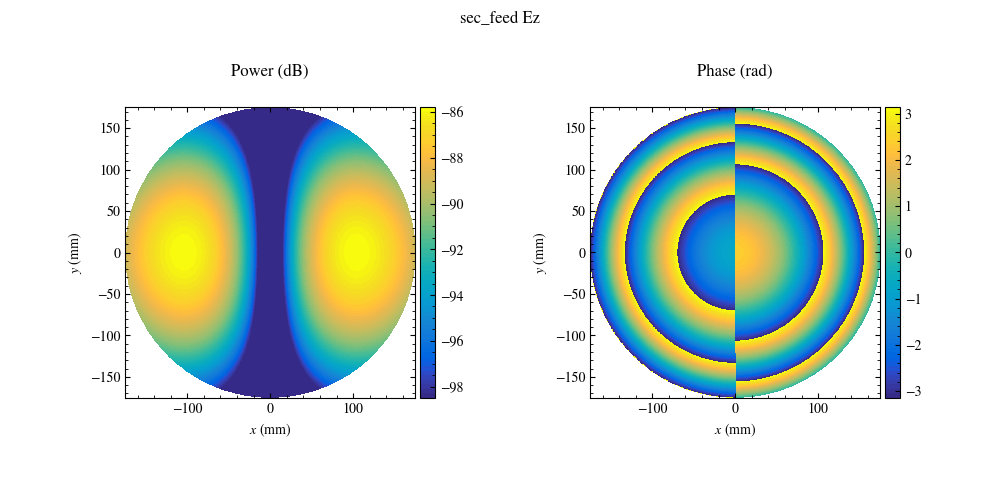

In [39]:
s.plotBeam2D('sec_feed', PyPO.Enums.FieldComponents.Ex, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('sec_feed', PyPO.Enums.FieldComponents.Ey, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('sec_feed', PyPO.Enums.FieldComponents.Ez, correct_phase=1, norm=False, vmin=-12.7)

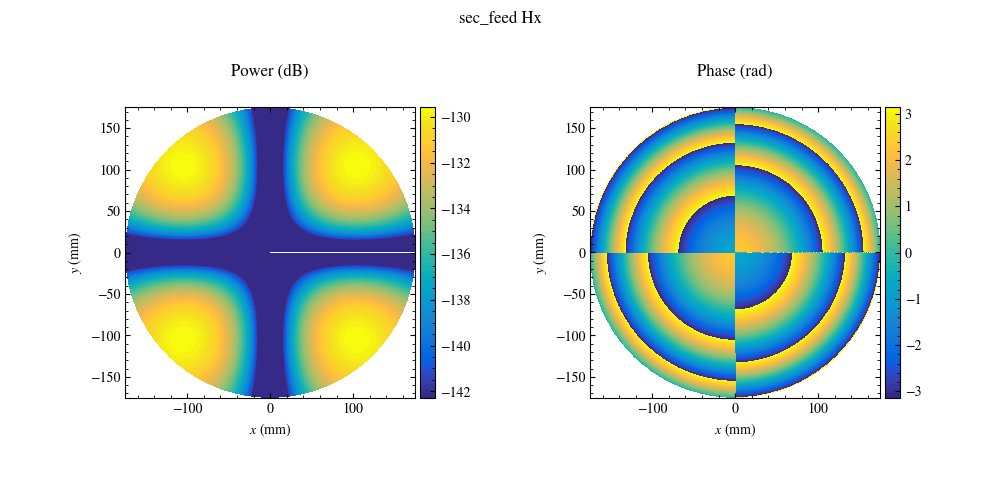

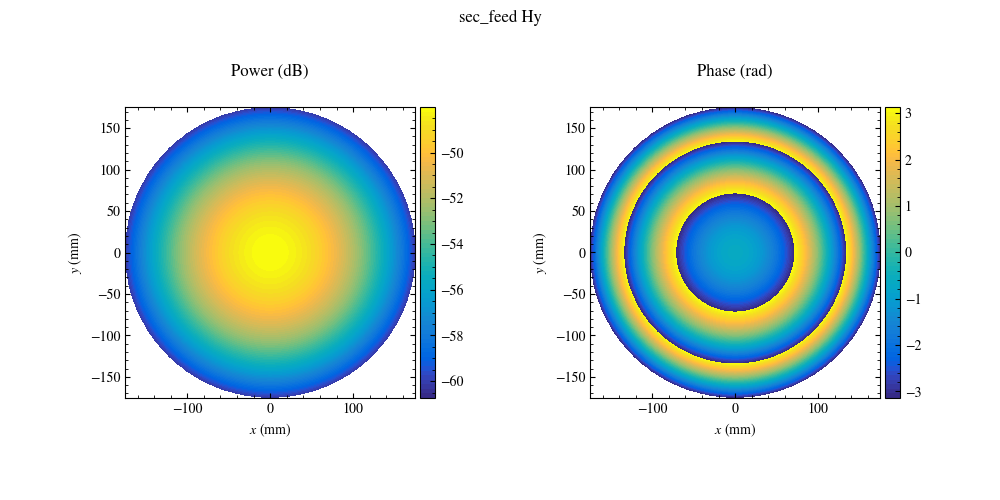

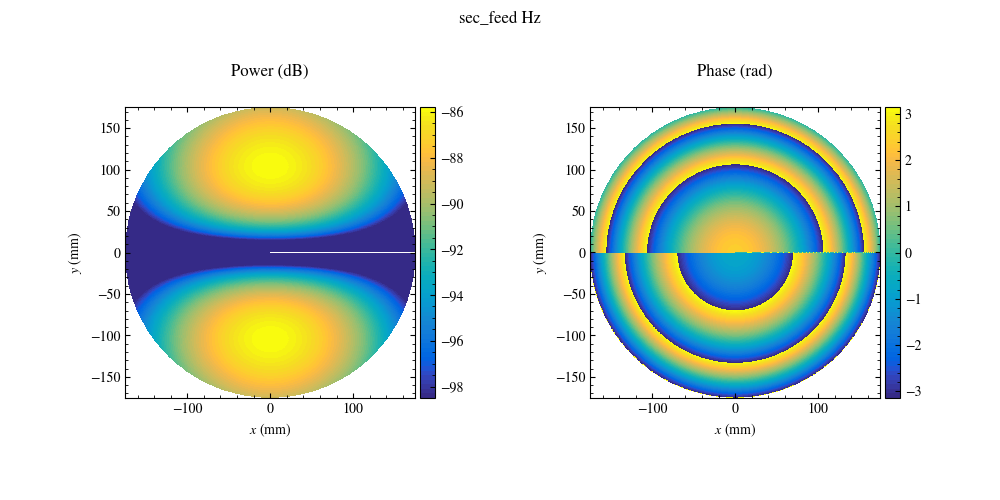

In [40]:
s.plotBeam2D('sec_feed', PyPO.Enums.FieldComponents.Hx, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('sec_feed', PyPO.Enums.FieldComponents.Hy, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('sec_feed', PyPO.Enums.FieldComponents.Hz, correct_phase=1, norm=False, vmin=-12.7)

## Fields from Gaussian Beam at Secondary

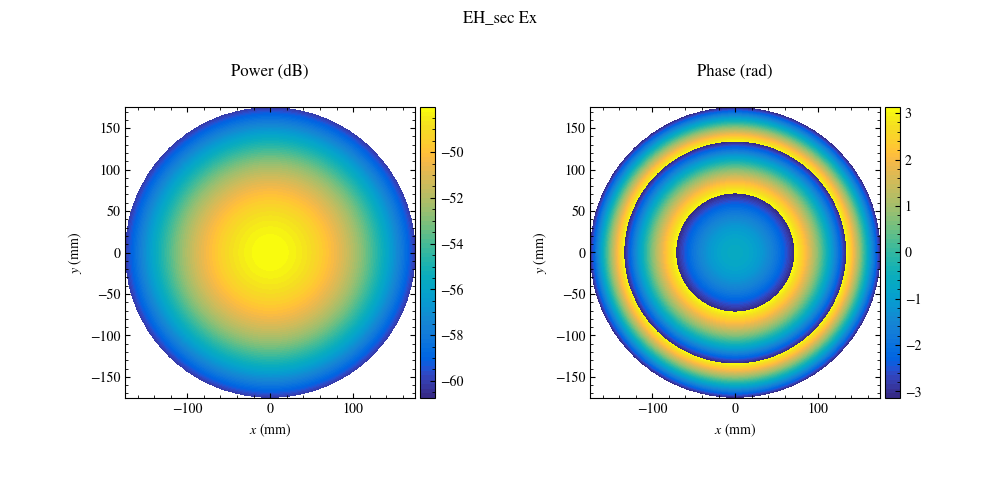

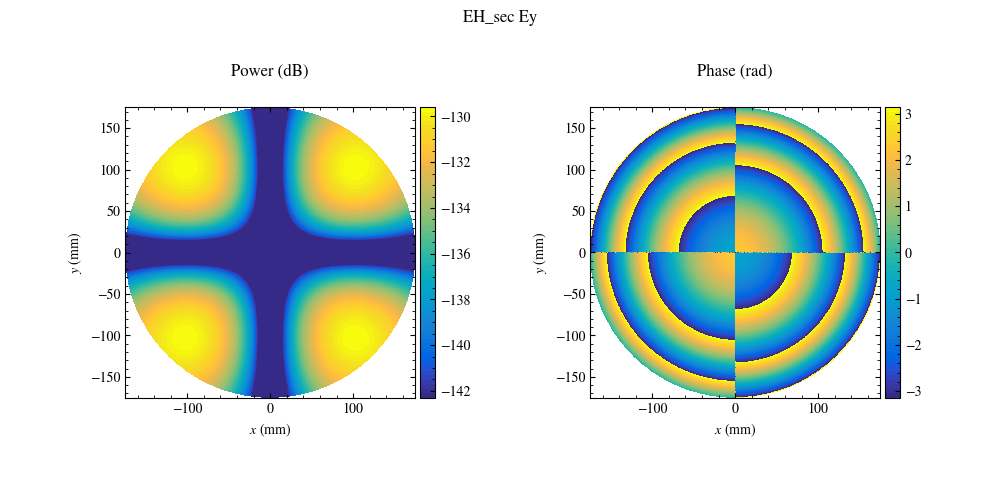

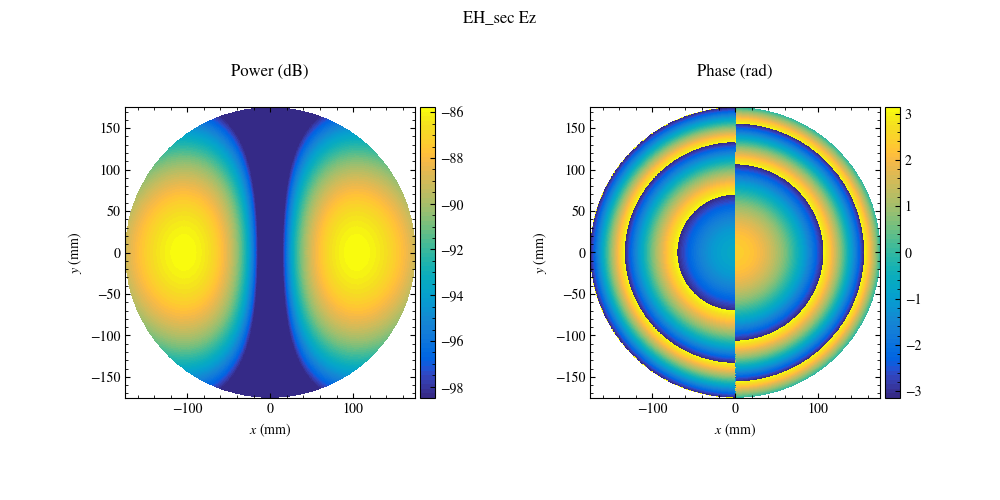

In [41]:
s.plotBeam2D('EH_sec', PyPO.Enums.FieldComponents.Ex, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_sec', PyPO.Enums.FieldComponents.Ey, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_sec', PyPO.Enums.FieldComponents.Ez, correct_phase=1, norm=False, vmin=-12.7)

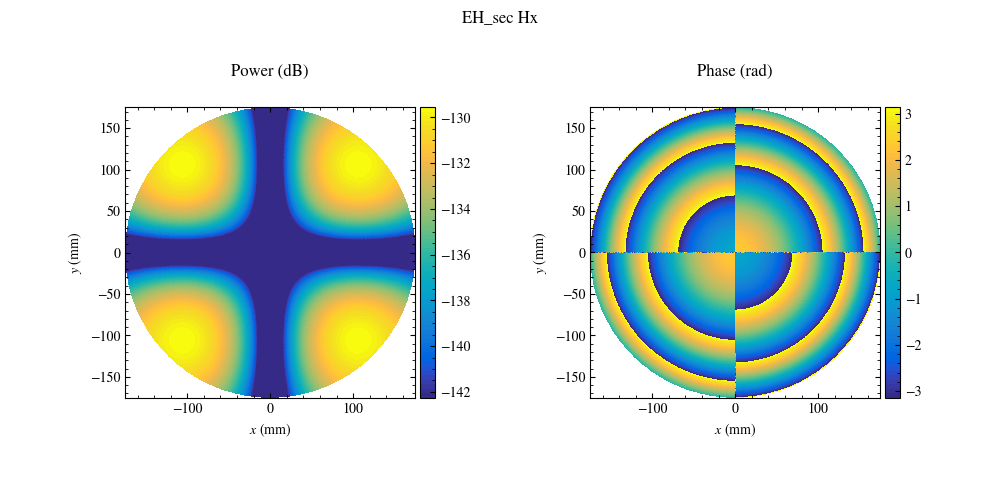

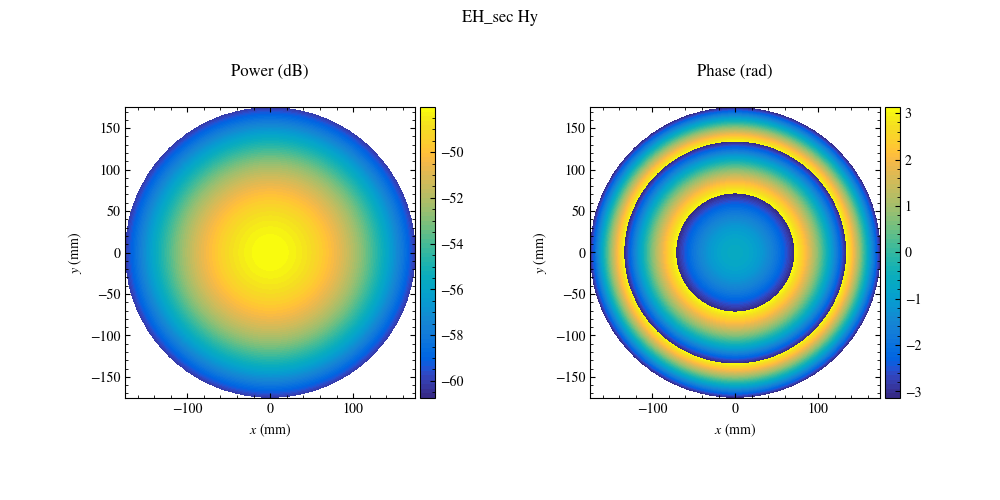

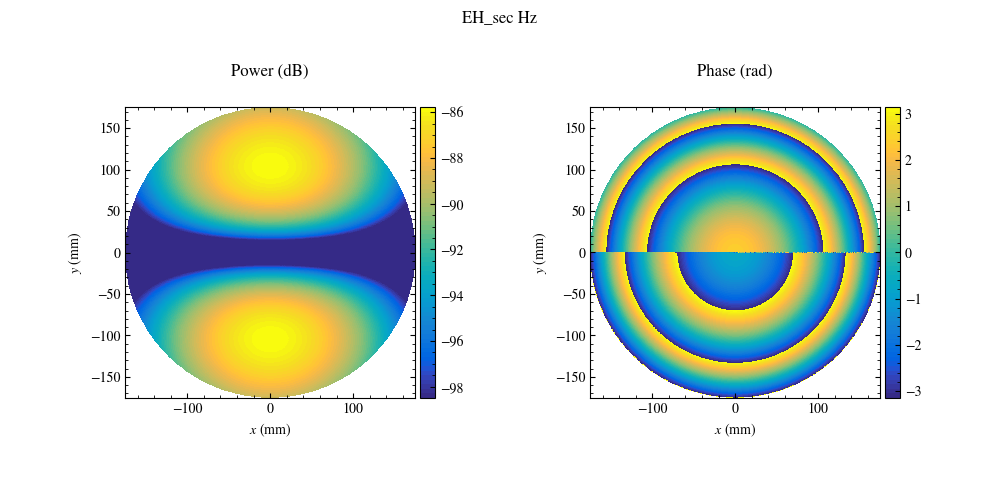

In [42]:
s.plotBeam2D('EH_sec', PyPO.Enums.FieldComponents.Hx, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_sec', PyPO.Enums.FieldComponents.Hy, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_sec', PyPO.Enums.FieldComponents.Hz, correct_phase=1, norm=False, vmin=-12.7)

## Fields from Gaussian Field at Secondary

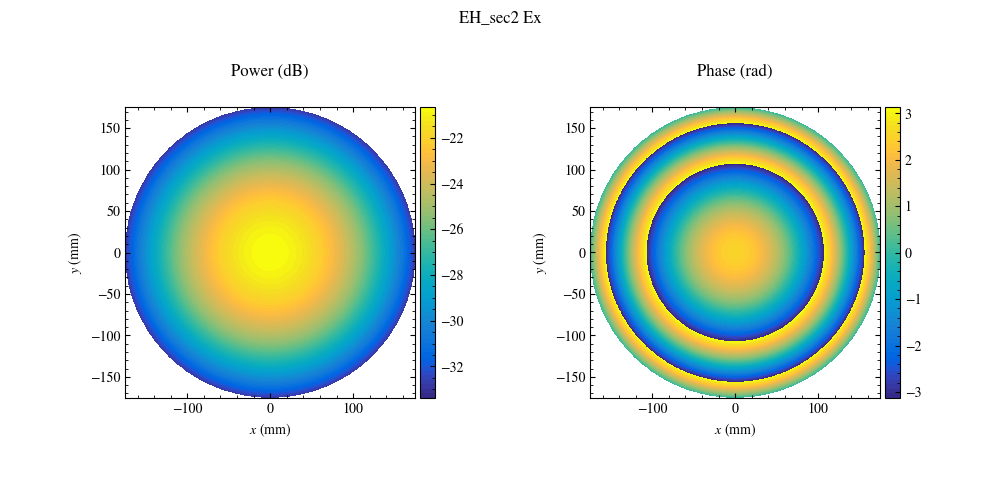

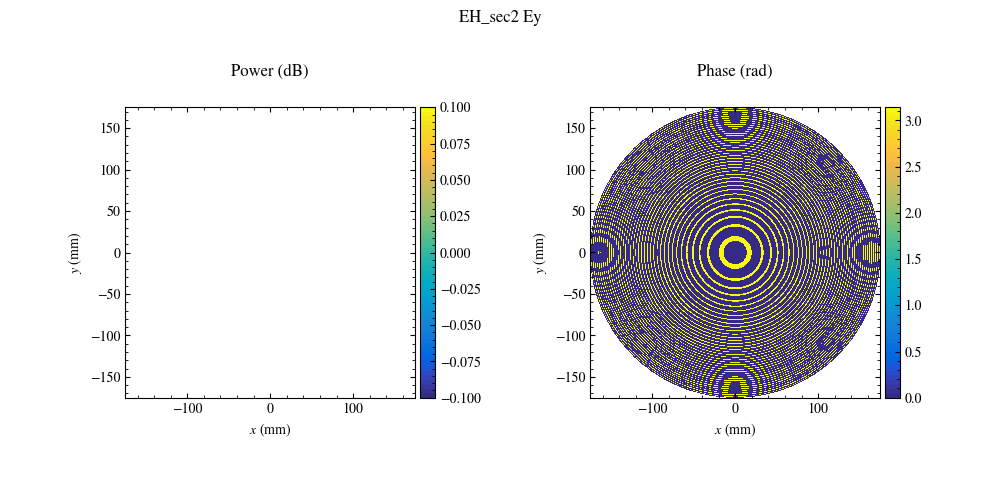

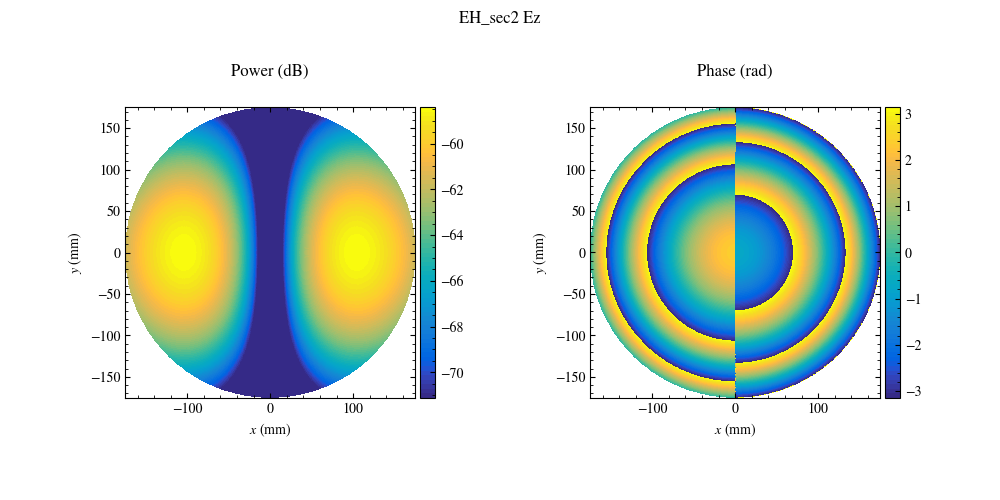

In [43]:
s.plotBeam2D('EH_sec2', PyPO.Enums.FieldComponents.Ex, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_sec2', PyPO.Enums.FieldComponents.Ey, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_sec2', PyPO.Enums.FieldComponents.Ez, correct_phase=1, norm=False, vmin=-12.7)

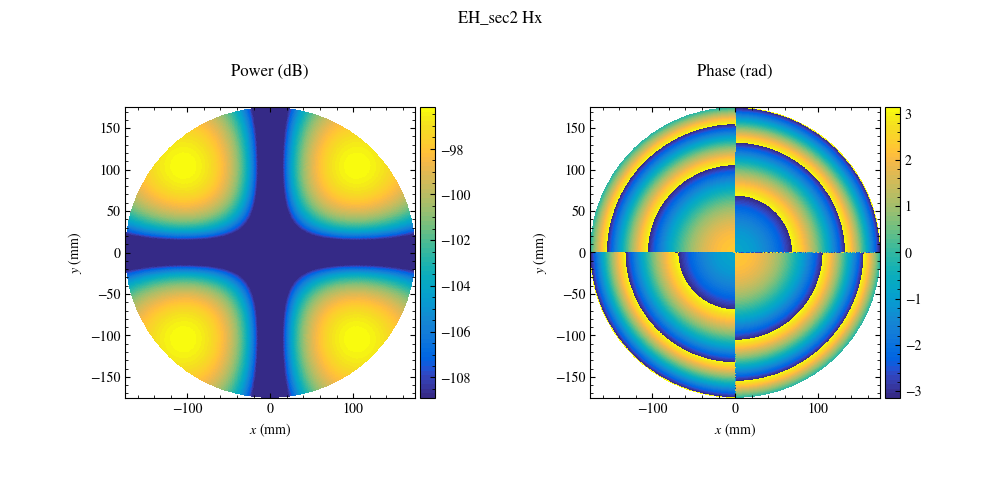

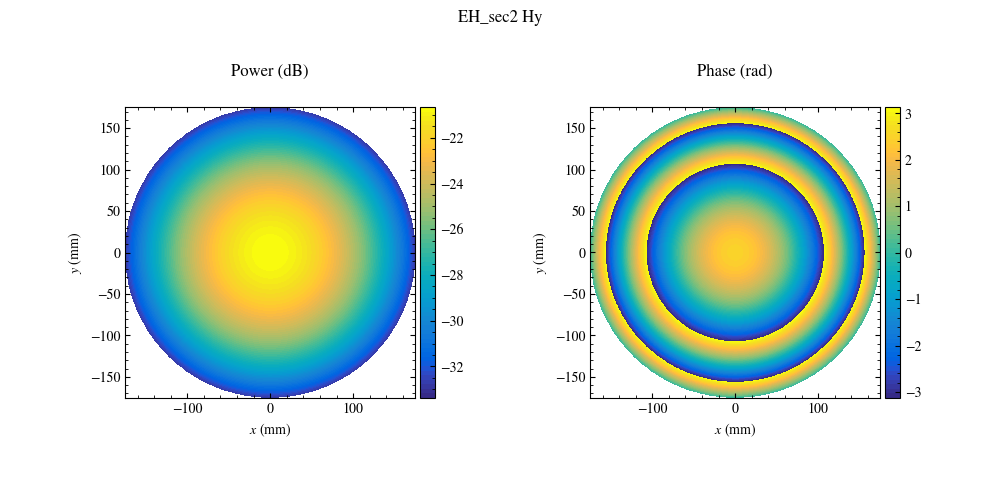

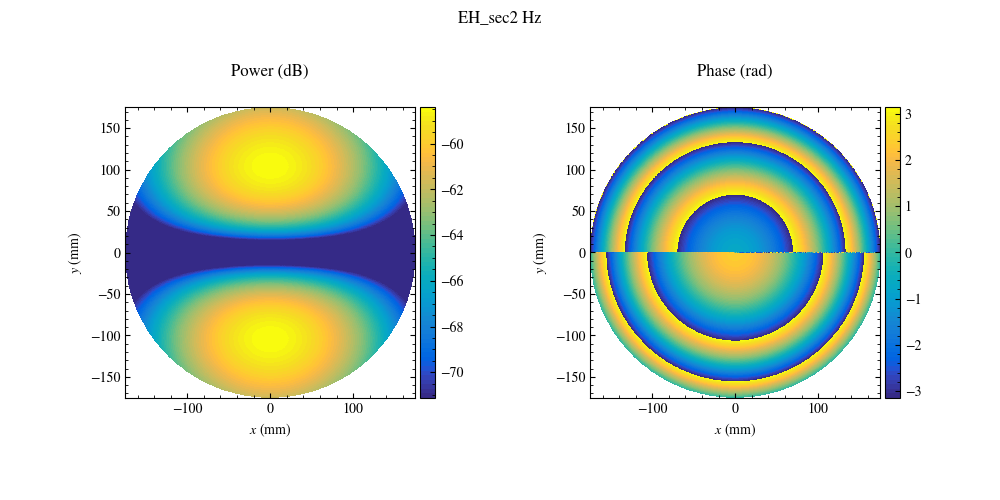

In [44]:
s.plotBeam2D('EH_sec2', PyPO.Enums.FieldComponents.Hx, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_sec2', PyPO.Enums.FieldComponents.Hy, correct_phase=1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_sec2', PyPO.Enums.FieldComponents.Hz, correct_phase=1, norm=False, vmin=-12.7)

In [45]:
grid = sec_grid
cut = 0

phase_factor = np.exp(1j*2*np.pi/lam*grid.z)

Text(0, 0.5, 'Phase (rad)')

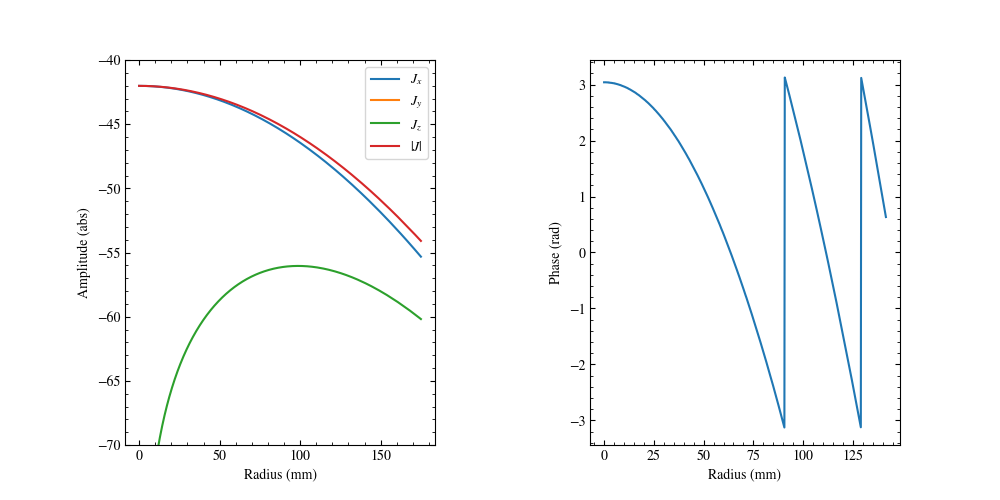

In [46]:

fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.currents['JM_sec'].Jx[:,cut])), label='$J_x$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.currents['JM_sec'].Jy[:,cut])), label='$J_y$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.currents['JM_sec'].Jz[:,cut])), label='$J_z$')
ax[0].plot(grid.x[:,cut], 10*np.log10(np.abs(s.currents['JM_sec'].Jx[:,cut])**2 + np.abs(s.currents['JM_sec'].Jy[:,cut])**2 + np.abs(s.currents['JM_sec'].Jz[:,cut])**2), label='$|J|$')
ax[0].legend()
ax[0].set_xlabel('Radius (mm)')

ax[0].set_ylabel('Amplitude (abs)')
ax[0].set_ylim((-70,-40))

ax[1].plot(grid.y[:,180], np.angle(s.currents['JM_sec'].Jx[:,180]*phase_factor[:,180]))
ax[1].set_xlabel('Radius (mm)')
ax[1].set_ylabel('Phase (rad)')

Text(0, 0.5, 'Phase (rad)')

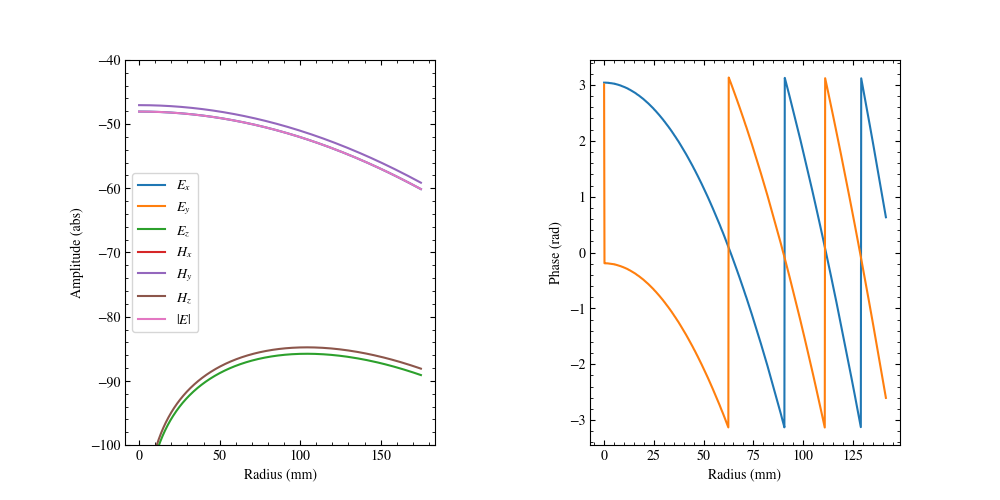

In [47]:
cut = 0
hcut = int(s.system['secondary']["gridsize"][1]/4)

fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_sec'].Ex[:,cut])), label='$E_x$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_sec'].Ey[:,cut])), label='$E_y$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_sec'].Ez[:,cut])), label='$E_z$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_sec'].Hx[:,hcut]))+1, label='$H_x$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_sec'].Hy[:,hcut]))+1, label='$H_y$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_sec'].Hz[:,hcut]))+1, label='$H_z$')
ax[0].plot(grid.x[:,cut], 10*np.log10(np.abs(s.fields['EH_sec'].Ex[:,cut])**2 + np.abs(s.fields['EH_sec'].Ey[:,cut])**2 + np.abs(s.fields['EH_sec'].Ez[:,cut])**2), label='$|E|$')
ax[0].legend()
ax[0].set_xlabel('Radius (mm)')
ax[0].set_ylim((-100,-40))
ax[0].set_ylabel('Amplitude (abs)')

ax[1].plot(grid.y[:,180], np.angle(s.fields['EH_sec'].Ex[:,cut]*phase_factor[:,cut]))
#ax[1].plot(grid.y[:,180], np.angle(s.fields['EH_sec'].Ey[:,cut]*phase_factor[:,cut]))
ax[1].plot(grid.y[:,180], np.angle(s.fields['EH_sec'].Ez[:,cut]*phase_factor[:,cut]))
ax[1].set_xlabel('Radius (mm)')
ax[1].set_ylabel('Phase (rad)')

# PO from Sec to primary

In [48]:

# Physical optics calculation definition from secondary to primary
sec_to_pri_PO = {
        "t_name"    : "primary",
        "s_current" : "JM_sec",
        "epsilon"   : epsilon,
        "mode"      : mode,
        "name_JM"   : "JM_pri",
        "name_EH"   : "EH_pri",
        "device"    : method,
        "nThreads"  : nThreads
        }

# Physical optics calculation definition from secondary to primary
sec_feed_to_pri_PO = {
        "t_name"    : "primary",
        "s_current" : "sec_feed",
        "epsilon"   : epsilon,
        "mode"      : mode,
        "name_JM"   : "JM_pri3",
        "name_EH"   : "EH_pri3",
        "device"    : method,
        "nThreads"  : nThreads
        }

# Physical optics calculation definition from secondary to primary
sec2_to_pri_PO = {
        "t_name"    : "primary",
        "s_current" : "JM_sec2",
        "epsilon"   : epsilon,
        "mode"      : mode,
        "name_JM"   : "JM_pri2",
        "name_EH"   : "EH_pri2",
        "device"    : method,
        "nThreads"  : nThreads
        }


# Run Physical Optics on the Primary

In [49]:

s.runPO(sec_to_pri_PO)
step_times.append(perf_counter() - step_times[-1] - start)


2026-03-20 07:39:57 - WORK - *** Starting PO propagation *** 
2026-03-20 07:39:57 - WORK - Propagating JM_sec on secondary to primary, propagation mode: JMEH. 
2026-03-20 07:39:57 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-20 07:39:57 - WORK - ... Calculating ... 
2026-03-20 07:40:19 - WORK - *** Finished: 21.728 seconds *** 


In [50]:

s.runPO(sec2_to_pri_PO)
step_times.append(perf_counter() - step_times[-1] - start)


2026-03-20 07:40:19 - WORK - *** Starting PO propagation *** 
2026-03-20 07:40:19 - WORK - Propagating JM_sec2 on secondary to primary, propagation mode: JMEH. 
2026-03-20 07:40:19 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-20 07:40:19 - WORK - ... Calculating ... 
2026-03-20 07:40:41 - WORK - *** Finished: 22.421 seconds *** 


In [51]:

s.runPO(sec_feed_to_pri_PO)
step_times.append(perf_counter() - step_times[-1] - start)


2026-03-20 07:40:41 - WORK - *** Starting PO propagation *** 
2026-03-20 07:40:41 - WORK - Propagating sec_feed on secondary to primary, propagation mode: JMEH. 
2026-03-20 07:40:41 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-20 07:40:41 - WORK - ... Calculating ... 
2026-03-20 07:41:06 - WORK - *** Finished: 24.765 seconds *** 


## Fields at Primary

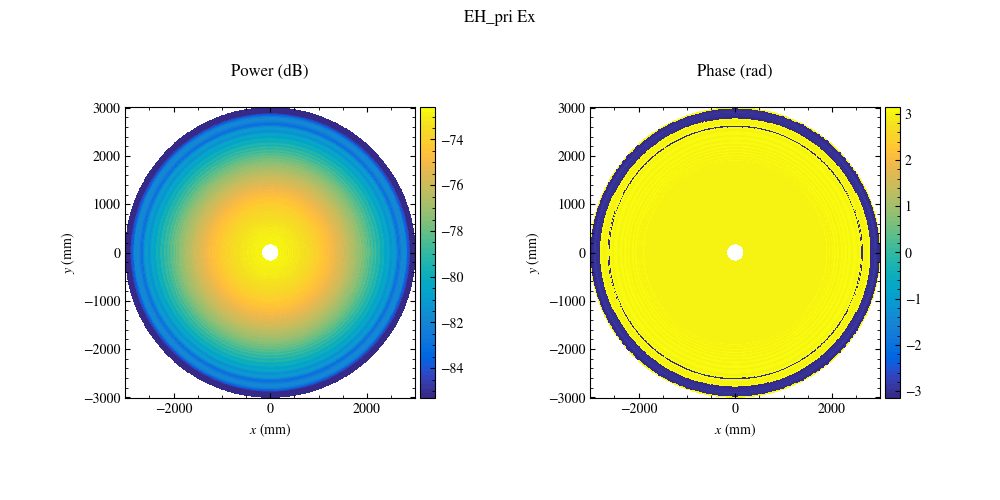

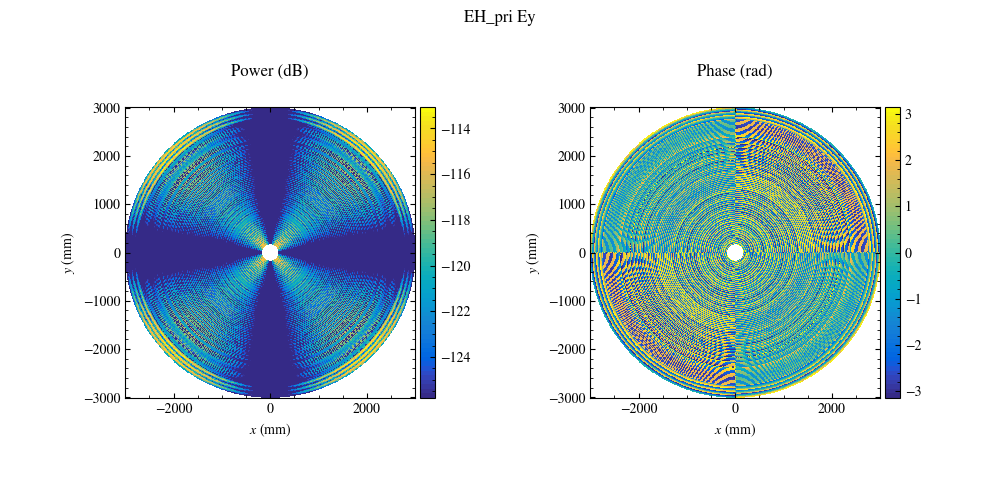

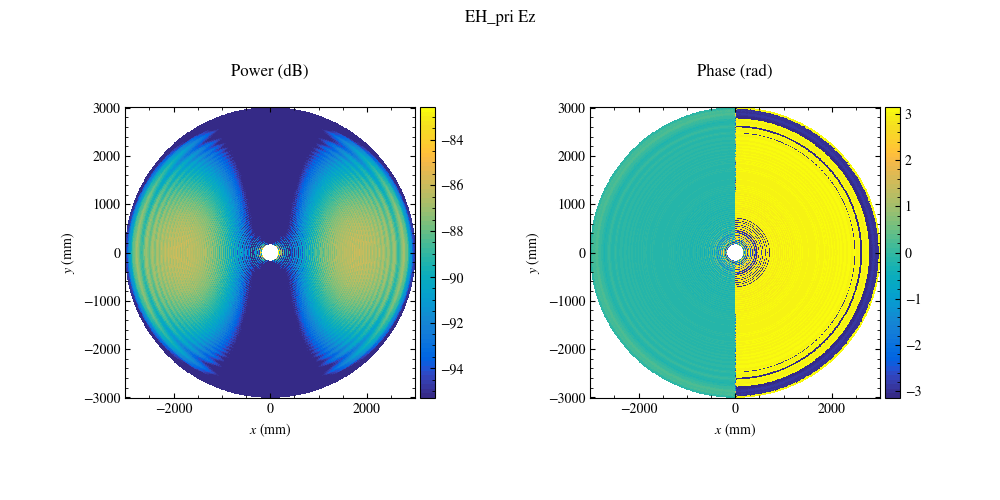

In [52]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Ex, correct_phase=-1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Ey, correct_phase=-1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Ez, correct_phase=-1, norm=False, vmin=-12.7)

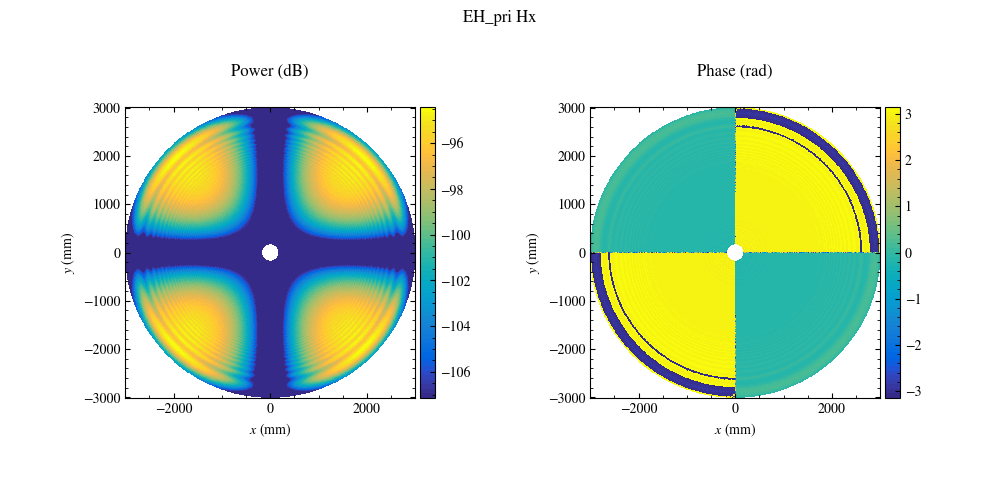

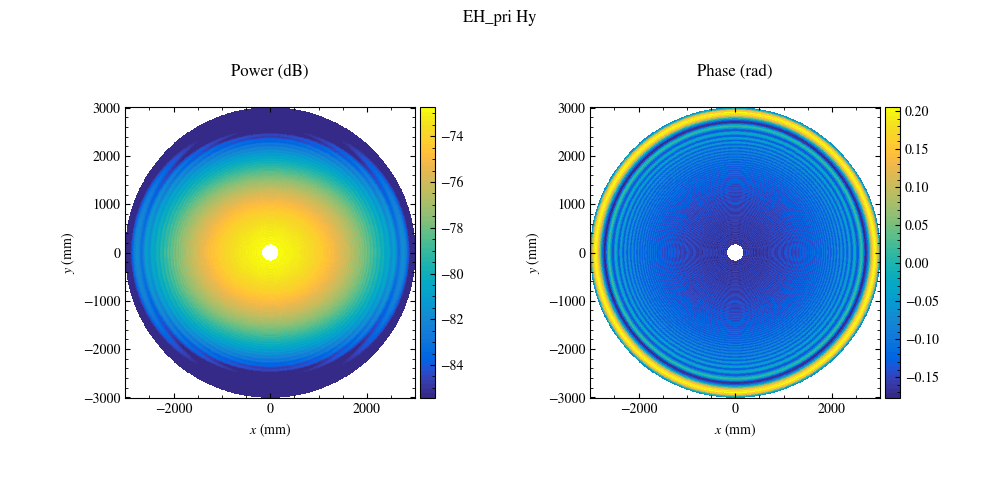

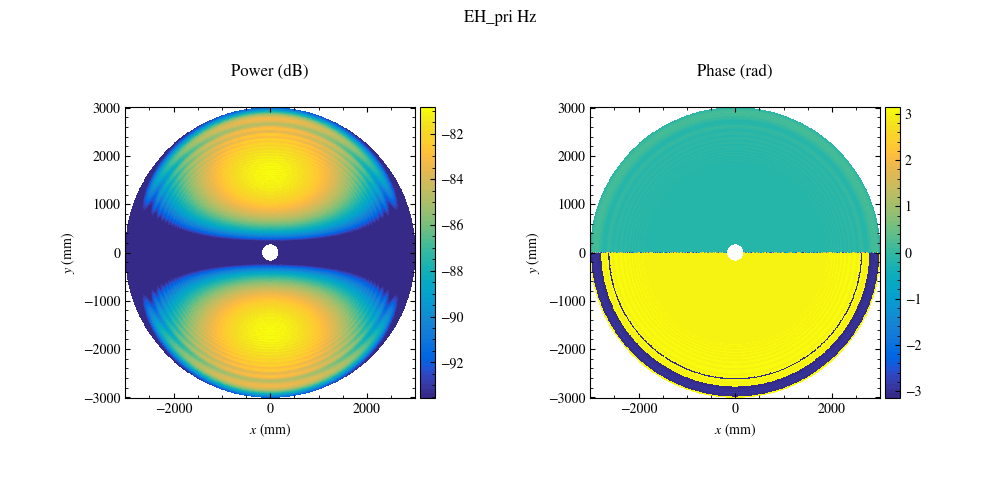

In [53]:
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Hx, correct_phase=-1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Hy, correct_phase=-1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_pri', PyPO.Enums.FieldComponents.Hz, correct_phase=-1, norm=False, vmin=-12.7)

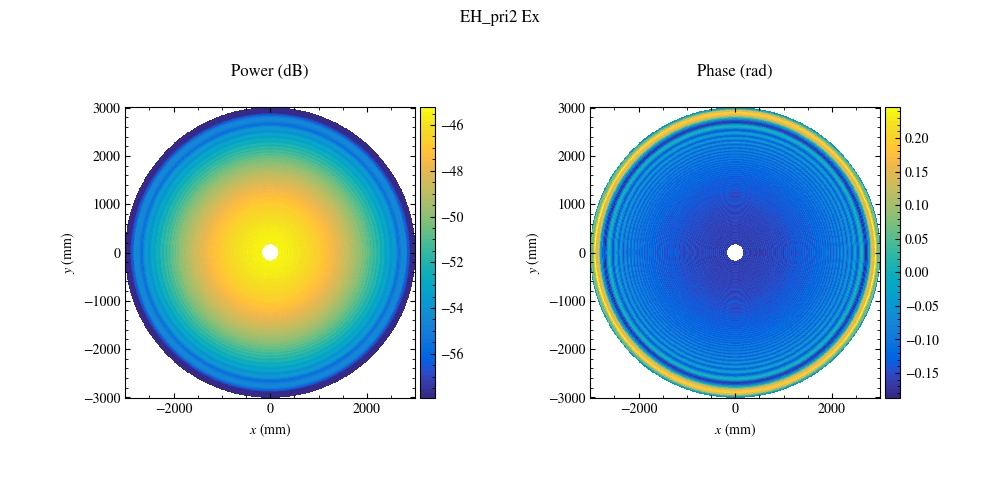

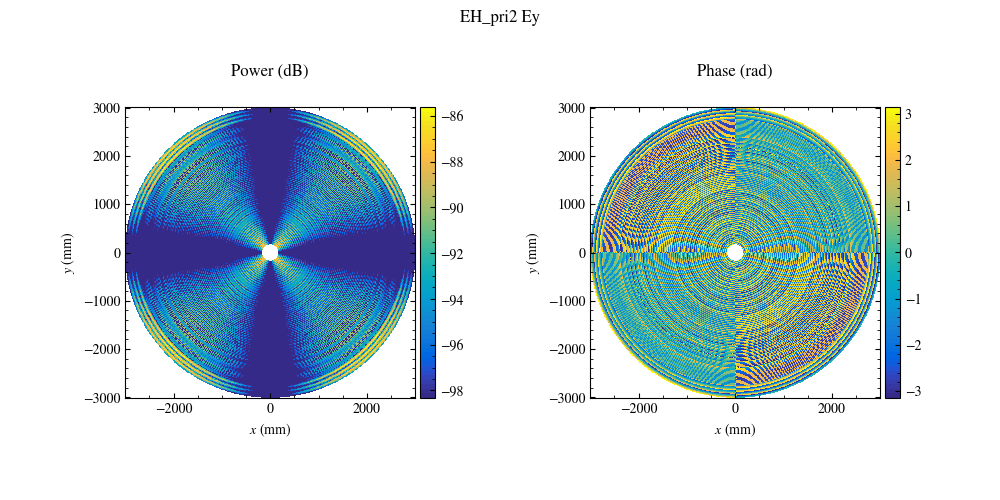

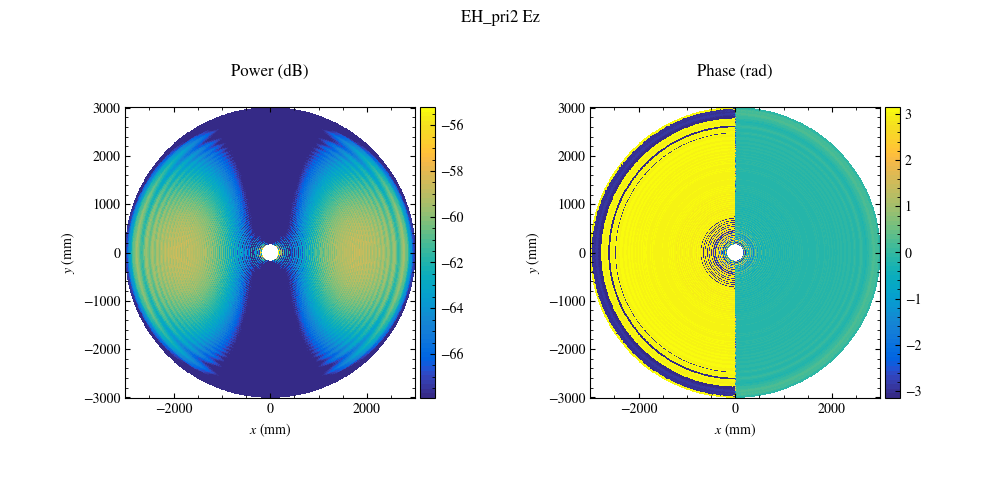

In [54]:
s.plotBeam2D('EH_pri2', PyPO.Enums.FieldComponents.Ex, correct_phase=-1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_pri2', PyPO.Enums.FieldComponents.Ey, correct_phase=-1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_pri2', PyPO.Enums.FieldComponents.Ez, correct_phase=-1, norm=False, vmin=-12.7)

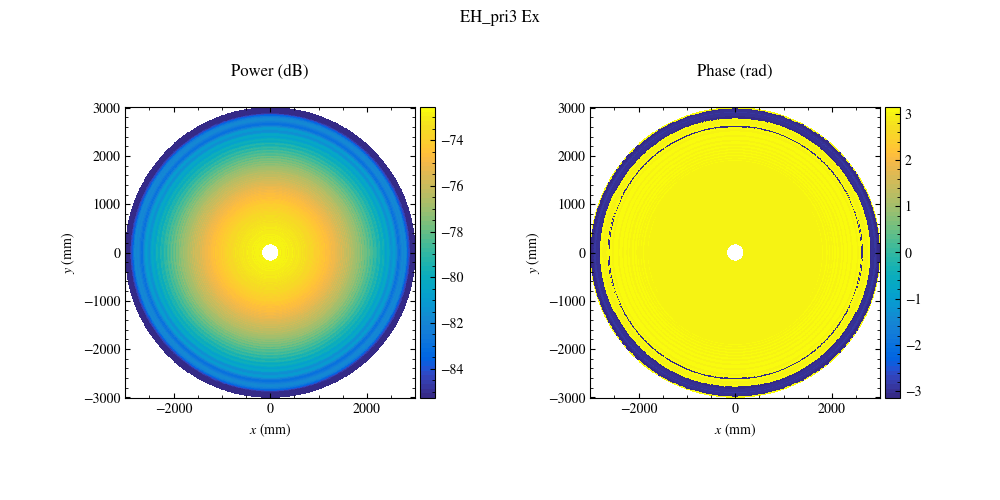

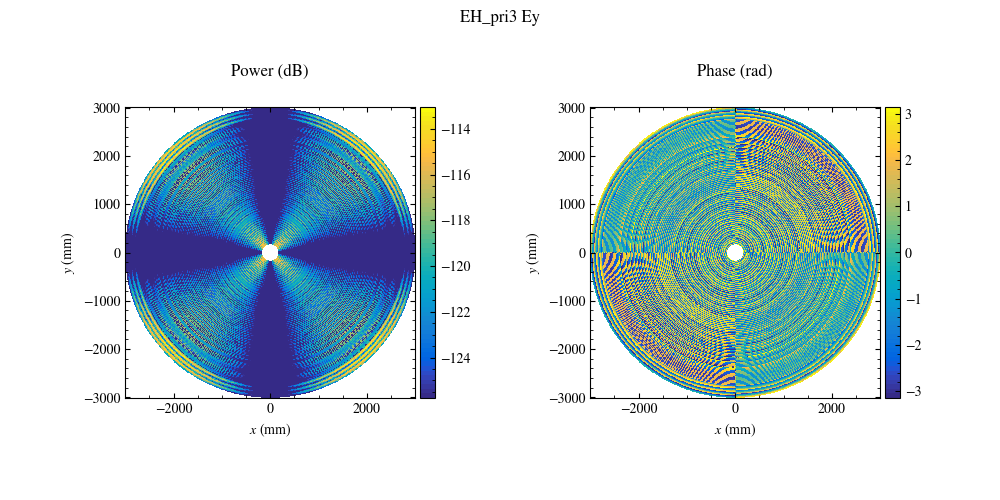

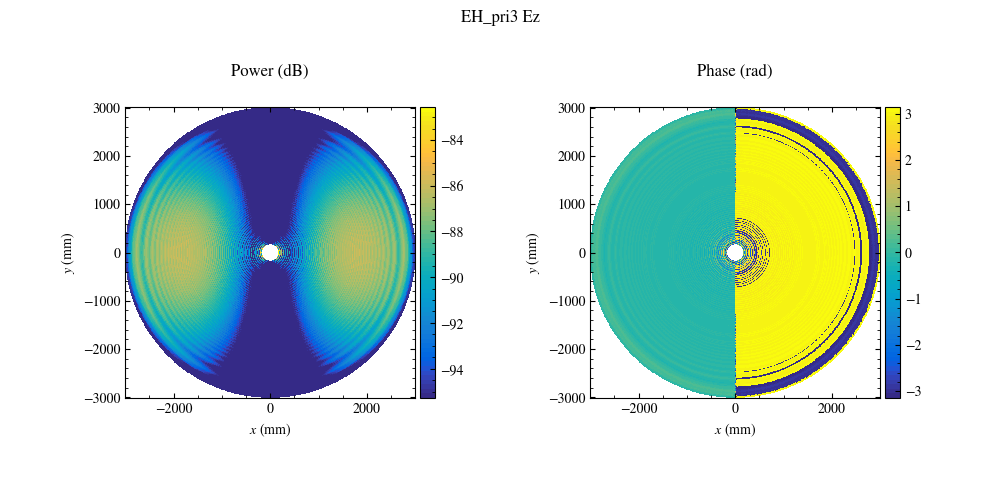

In [55]:
s.plotBeam2D('EH_pri3', PyPO.Enums.FieldComponents.Ex, correct_phase=-1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_pri3', PyPO.Enums.FieldComponents.Ey, correct_phase=-1, norm=False, vmin=-12.7)
s.plotBeam2D('EH_pri3', PyPO.Enums.FieldComponents.Ez, correct_phase=-1, norm=False, vmin=-12.7)

Text(0, 0.5, 'Phase (rad)')

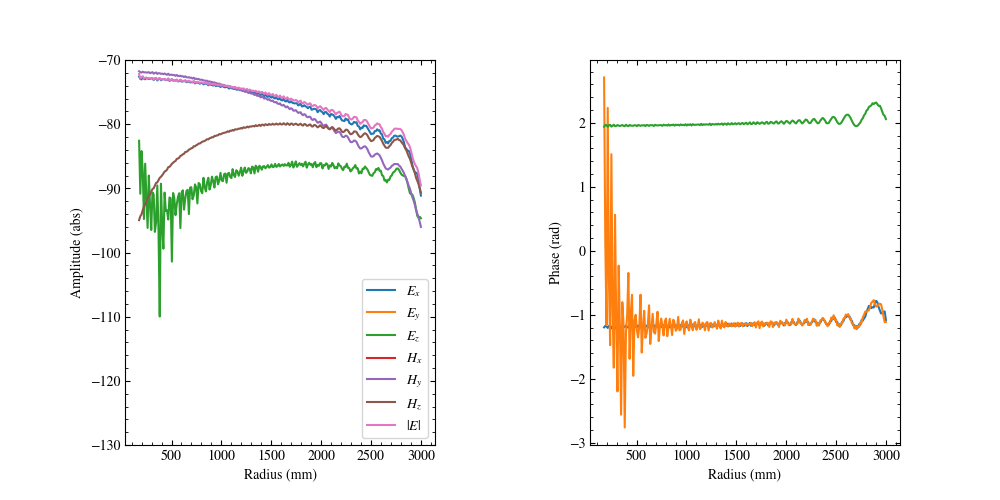

In [56]:
grid = pri_grid

cut = 0
hcut = int(s.system['primary']["gridsize"][1]/4)

phase_factor = np.exp(1j*2*np.pi/lam*grid.z)

fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_pri'].Ex[:,cut])), label='$E_x$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_pri'].Ey[:,cut])), label='$E_y$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_pri'].Ez[:,cut])), label='$E_z$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_pri'].Hx[:,hcut]))+1, label='$H_x$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_pri'].Hy[:,hcut]))+1, label='$H_y$')
ax[0].plot(grid.x[:,cut], 20*np.log10(np.abs(s.fields['EH_pri'].Hz[:,hcut]))+1, label='$H_z$')
ax[0].plot(grid.x[:,cut], 10*np.log10(np.abs(s.fields['EH_pri'].Ex[:,cut])**2 + np.abs(s.fields['EH_pri'].Ey[:,cut])**2 + np.abs(s.fields['EH_pri'].Ez[:,cut])**2), label='$|E|$')
ax[0].legend()
ax[0].set_xlabel('Radius (mm)')
ax[0].set_ylim((-130,-70))
ax[0].set_ylabel('Amplitude (abs)')

ax[1].plot(grid.x[:,cut], np.angle(s.fields['EH_pri'].Ex[:,cut]*phase_factor[:,cut]))
#ax[1].plot(grid.y[:,180], np.angle(s.fields['EH_sec'].Ey[:,cut]*phase_factor[:,cut]))
ax[1].plot(grid.x[:,cut], np.angle(s.fields['EH_pri'].Ez[:,cut]*phase_factor[:,cut]))
ax[1].plot(grid.y[:,hcut], np.angle(s.fields['EH_pri'].Hz[:,hcut]*phase_factor[:,hcut]))
ax[1].set_xlabel('Radius (mm)')
ax[1].set_ylabel('Phase (rad)')

# Farfield Beams

In [57]:
# Physical optics calculation definition from primary to far field
pri_to_ff_PO = {
        "t_name"    : "farfield_plane",
        "s_current" : "JM_pri",
        "epsilon"   : epsilon,
        "mode"      : "FF",
        "name_EH"   : "EH_ff",
        "device"    : method,
        "nThreads"  : nThreads
        }

In [58]:
s.runPO(pri_to_ff_PO)
step_times.append(perf_counter() - step_times[-1] - start )

2026-03-20 07:41:22 - WORK - *** Starting PO propagation *** 
2026-03-20 07:41:22 - WORK - Propagating JM_pri on primary to farfield_plane, propagation mode: FF. 
2026-03-20 07:41:22 - WORK - Hardware: running 256 CUDA threads per block. 
2026-03-20 07:41:22 - WORK - ... Calculating ... 
2026-03-20 07:41:25 - WORK - *** Finished: 3.672 seconds *** 


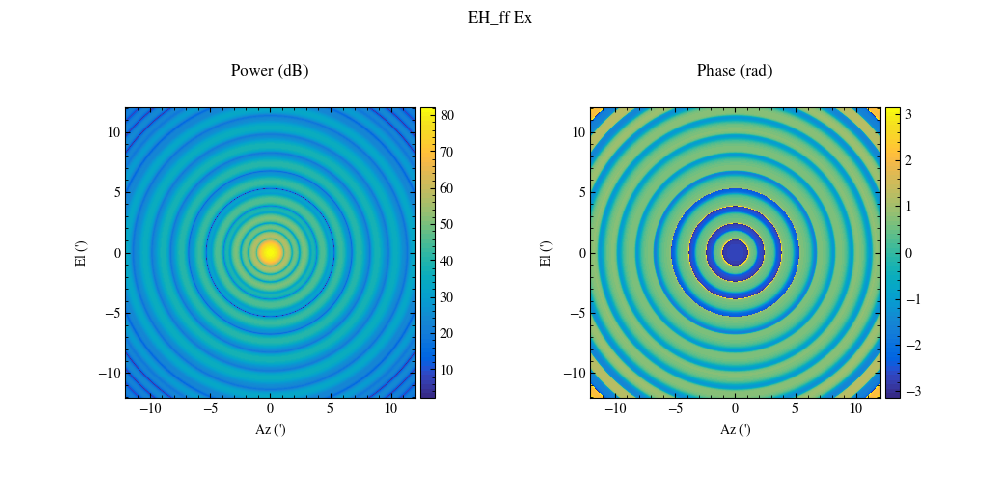

In [59]:
s.plotBeam2D('EH_ff', PyPO.Enums.FieldComponents.Ex, scale=Scales.dB, norm=False, vmin =-80, units=Units.AM)

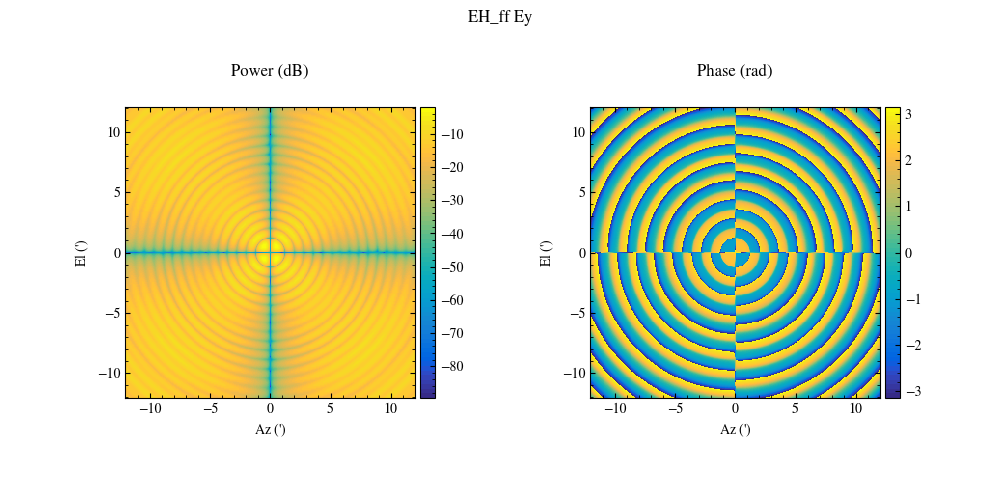

In [60]:
s.plotBeam2D('EH_ff', PyPO.Enums.FieldComponents.Ey, scale=Scales.dB, norm=False, units=Units.AM)

Text(0, 0.5, 'Phase (rad)')

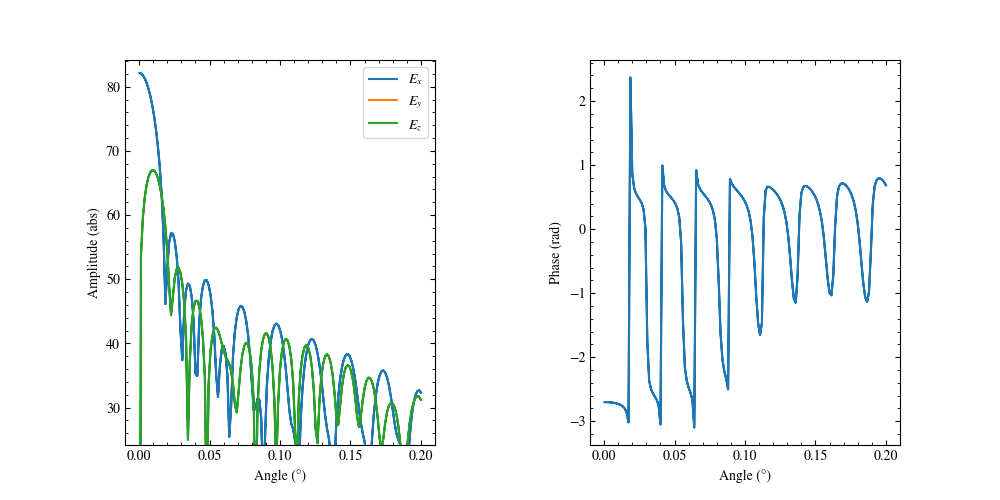

In [65]:
field = 'EH_ff'

grid = s.generateGrids('farfield_plane')

row = int(ff_ngrid/2)

vmax = np.max(20*np.log10(np.abs(s.fields[field].Ex[:,row]))) + 2

vmin = vmax-60

fig, ax = plt.subplots(1,2, figsize=(10,5), gridspec_kw={'wspace':0.5})
ax[0].plot(np.rad2deg(grid.x[:,row]), 20*np.log10(np.abs(s.fields[field].Ex[:,row])), label='$E_x$',)
ax[0].plot(np.rad2deg(grid.x[:,row]), 20*np.log10(np.abs(s.fields[field].Ey[:,row])), label='$E_y$')
ax[0].plot(np.rad2deg(grid.x[:,row]), 20*np.log10(np.abs(s.fields[field].Ez[:,row])), label='$E_z$')
#ax[0].axvline(fwhm/2, ls=":")
#ax[0].axhline(10*np.log10(np.max(np.abs(s.fields[field].Ex[:,row])**2)/2), ls=":")
ax[0].legend()
ax[0].set_xlabel('Angle (°)')
ax[0].set_ylabel('Amplitude (abs)')
ax[0].set_ylim((vmin, vmax))

ax[1].plot(np.rad2deg(grid.x[:,row]), (np.angle(s.fields[field].Ex[:,row])))
ax[1].set_xlabel('Angle (°)')
ax[1].set_ylabel('Phase (rad)')

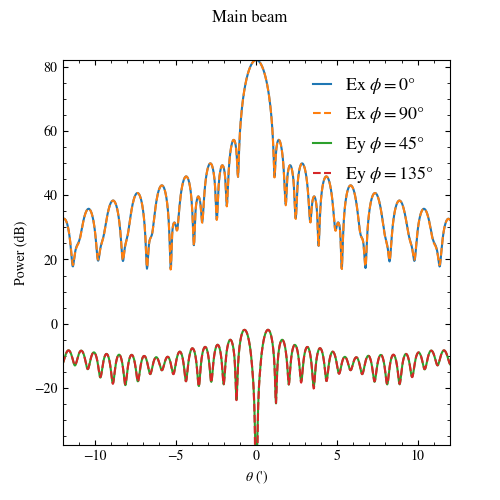

In [62]:
s.plotBeamCut("EH_ff", FieldComponents.Ex, comp_cross=FieldComponents.Ey, title="Main beam", units=Units.AM, vmin=-120, norm=False)

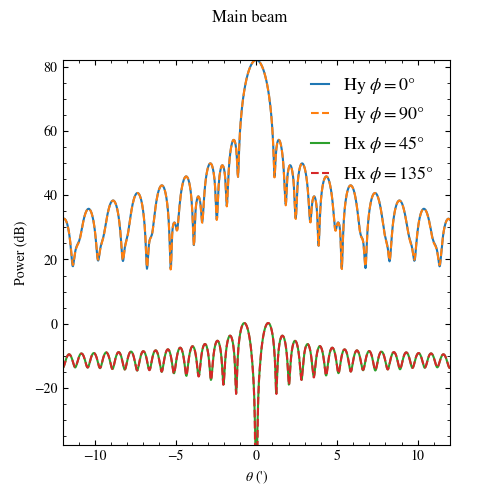

In [63]:
s.plotBeamCut("EH_ff", FieldComponents.Hy, comp_cross=FieldComponents.Hx, title="Main beam", units=Units.AM, vmin=-120, norm=False)

In [64]:
import os.path

path = os.path.join("results", "sma_cassegrain")

for f in s.fields.keys():
    filename = os.path.join(path, f + '_fields')
    grid = s.generateGrids(s.fields[f].surf)
    np.savez_compressed(filename, **s.fields[f].__dict__)
    np.savez_compressed(filename+"_grid", **grid.__dict__)
    
    
    
for f in s.currents.keys():
    filename = os.path.join(path, f + '_currents')
    np.savez_compressed(filename, **s.currents[f].__dict__)
    np.savez_compressed(filename+"_grid", **grid.__dict__)
    
    